<a href="https://colab.research.google.com/github/Deepak-Mewada/NMA-CN/blob/main/Project_load_stringer_orientations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading of Stringer orientations data

includes some visualizations

In [ ]:
#@title Data retrieval
import os, requests

fname = "stringer_orientations.npy"
url = "https://osf.io/ny4ut/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [ ]:
#@title Import matplotlib and set defaults
from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [ ]:
#@title Data loading
import numpy as np
dat = np.load('stringer_orientations.npy', allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'istim', 'stat', 'u_spont', 'v_spont', 'mean_spont', 'std_spont', 'stimtimes', 'frametimes', 'camtimes', 'run', 'info', 'xyz'])


dat has fields:
* `dat['sresp']`: neurons by stimuli, a.k.a. the neural response data (23589 by 4598)
* `dat['xyz']`: three-dimensional position of each neuron in the brain. 
* `dat['run']`: 1 by stimuli, a.k.a. the running speed of the animal in a.u.
* `dat['istim']`: 1 by stimuli, goes from 0 to 2*np.pi, the orientations shown on each trial
* `dat['u_spont']`: neurons by 128, the weights for the top 128 principal components of spontaneous activity. Unit norm.
* `dat['v_spont']`: 128 by 910, the timecourses for the top 128 PCs of spont activity.
* `dat['u_spont'] @ dat['v_spont']`: a reconstruction of the spontaneous activity for 910 timepoints interspersed throughout the recording.
* `dat['stat']`: 1 by neurons, some statistics for each neuron, see Suite2p for full documentation.


In [ ]:
print(dat['sresp'].shape)
print(len(dat['stat']))

(23589, 4598)
23589


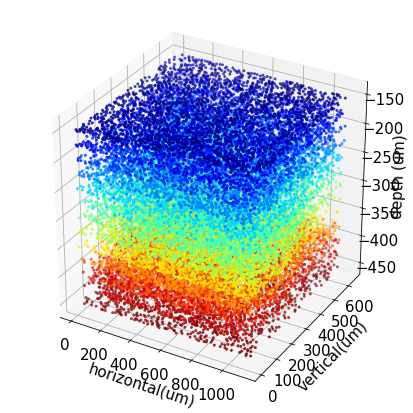

In [ ]:
# @title plot the 3D positions of all neurons
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

x, y, z = dat['xyz']

zunq, iunq = np.unique(z, return_inverse=True)
xc = np.linspace(0.0, 1.0, len(zunq))
cmap = cm.get_cmap('jet')(xc)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[::-1],y[::-1],z[::-1], 'o', s = 4, c = cmap[iunq])
ax.set(xlabel='horizontal(um)', ylabel = 'vertical(um)', zlabel='depth (um)');

In [ ]:
print(np.min(x),np.max(x))
print(np.min(y),np.max(y))
print(np.min(z),np.max(z))



6.0 1126.0
6.65 638.4000000000001
-450.0 -150.0


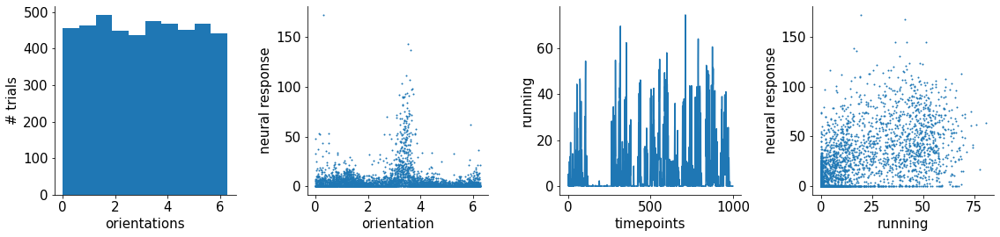

In [ ]:
#@title Basic data properties using plot, hist and scatter
ax = plt.subplot(1,5,1)
plt.hist(dat['istim'])
ax.set(xlabel='orientations', ylabel = '# trials')

ax = plt.subplot(1,5,2)
plt.scatter(dat['istim'], dat['sresp'][1000], s= 1)
ax.set(xlabel = 'orientation', ylabel = 'neural response')

ax = plt.subplot(1,5,3)
plt.plot(dat['run'][:1000])
ax.set(xlabel = 'timepoints', ylabel = 'running')

ax = plt.subplot(1,5,4)
plt.scatter(dat['run'], dat['sresp'][20998], s= 1)
ax.set(xlabel = 'running', ylabel = 'neural response')

plt.show()

In [ ]:
#@title take PCA after preparing data by z-score
from scipy.stats import zscore
from sklearn.decomposition import PCA 
Z = zscore(dat['sresp'], axis=1)
X = PCA(n_components = 200).fit_transform(Z.T)

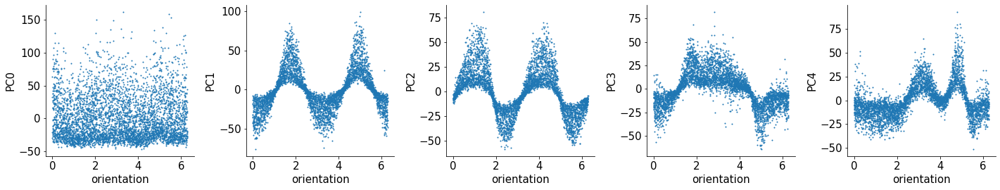

In [ ]:
#@title plot PCs as function of stimulus orientation
for j in range(5):
  ax = plt.subplot(1,5,j+1)
  plt.scatter(dat['istim'], X[:,j], s = 1)
  ax.set(xlabel='orientation', ylabel = 'PC%d'%j)
plt.show()

In [ ]:
#@title run a manifold embedding algorithm (UMAP) in two or three dimensions. 
!pip install umap-learn
from umap import UMAP
ncomp = 3 # try 2, then try 3
xinit = 3 * zscore(X[:,:ncomp], axis=0)
embed = UMAP(n_components=ncomp, init =  xinit, n_neighbors = 25, 
             metric = 'correlation', transform_seed = 42).fit_transform(X)

     |████████████████████████████████| 80 kB 7.1 MB/s 
     |████████████████████████████████| 1.1 MB 25.4 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76566 sha256=489696fbc792f367c688e4a2e999bdcb95f91d8aa259ebdb08069a29e6b9667f
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52372 sha256=3dbfd3f5349dffccdf2dfd99cd34faac37d027f899839e7d148d4153dc000389
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


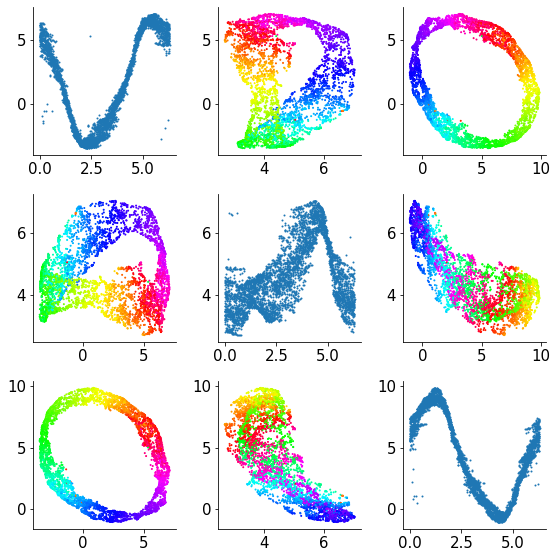

In [ ]:
plt.figure(figsize=(8,8))
for i in range(ncomp):
  for j in range(ncomp):
    plt.subplot(ncomp,ncomp, j + ncomp*i + 1)
    if i==j:
      plt.scatter(dat['istim'], embed[:,i], s  = 1)
    else:
      plt.scatter(embed[:,j], embed[:,i], s  = 1, c= dat['istim'], cmap = 'hsv')
# Is that a Mobius strip? A good project would be to try to figure out why (I don't know). 

In [ ]:
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering
import pandas as pd
import scipy.cluster.hierarchy as sch


In [ ]:
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
#model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

#model = model.fit(dat['sresp'])


In [ ]:
#labels = model.labels_

In [ ]:
#plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
#plot_dendrogram(model, truncate_mode='level', p=5)
#plt.xlabel("Number of points in node (or index of point if no parenthesis).")
#plt.show()

In [ ]:
X=dat['sresp']
plt.scatter(X[labels==0, 0], X[labels==0, 1], s=50, marker='o', color='red')
plt.scatter(X[labels==1, 0], X[labels==1, 1], s=50, marker='o', color='blue')
plt.scatter(X[labels==2, 0], X[labels==2, 1], s=50, marker='o', color='green')
plt.scatter(X[labels==3, 0], X[labels==3, 1], s=50, marker='o', color='purple')
plt.scatter(X[labels==4, 0], X[labels==4, 1], s=50, marker='o', color='orange')
plt.show()

# New Section

In [ ]:
def calculate_orientation_selectivity( neuron_response, orientations ):
	#Arguments:
  #neuron_response: ndarray (1 x Number of stimuli) - Neuron response to each stimulus.
  #orientations: ndarray (1 x Number of stimuli) - orientation of grating in each stimuli (in radians).
	#Returns:
  #orientation_selectivity: float - the preferred orientation (in radians) this neuron.
	#Description:
  #This function takes an array of responses for a single neuron, and an array of orientations which those responses correspond to. 
  #It then calculates which orientation generates the largest response for this neuron, and returns that orientation as a scalar value.

  max_activity_index=np.argmax(neuron_response)
  orientation_selectivity=orientations[max_activity_index]

  return orientation_selectivity

def calculate_all_orientation_selectivities( neuron_responses, orientations ):
	#Arguments:
  #neuron_responses: ndarray (no. of neurons x Number of stimuli) - Neuron responses to each stimulus.
  #orientations: ndarray (1 x Number of stimuli) - orientation of grating in each stimuli (in radians).
	#Returns:
  #orientation_selectivities: array (1 x Number of neurons) - the preferred orientations (in radians) for each neuron.
	#Description:
  #This function just applies the previous function (calculate_orientation_selectivity) over an array of multiple neurons, 
  #returning the feature selectivity for each neuron.
  orientation_selectivities=np.array([0.00] * len(neuron_responses))

  for i in range(len(neuron_responses)):
      orientation_selectivities[i]=calculate_orientation_selectivity(dat['sresp'][i],dat['istim'])

  return orientation_selectivities


#----------------------

def calculate_orientation_diff(orientation1,orientation2):
    diff=np.absolute(orientation1-orientation2)
    if(diff>np.pi): diff=diff-np.pi
    return diff
    
def quantify_pinwheel( neuron_positions, orientation_selectivities):
	#Arguments:
  #neuron_positions: ndarray (no. of neurons x 3) - The xyz position of each neuron
  #orientation_selectivites: ndarray (1 x Number of neurons) - orientation selectivity of each neuron (in radians).
	#Returns:
  #euclidean _distances: ndarray (1 X Number of neurons) of pairwise distances between neurons.
  #orientation_similarity: ndarray (1 X Number of neurons) of Orientation similarity between pairwise combinations of neurons.
  #Description:
  #This function should compare the orientation selectivities for all neurons using cosine similarity and calculate the euclidean distance between them, returning each as a vector.

  x,y,z=neuron_positions
  n=len(neuron_positions[0])
  lower_triangle_size=int (n*(n-1)/2)
  euclidean_distances=np.array(np.zeros(lower_triangle_size),float)
  orientation_similarity=np.empty(lower_triangle_size,float)
  k=0
  #print(n,lower_triangle_size)
  for i in range(n):
    for j in range(i) :
      euclidean_distances[k] = np.sqrt((x[i]-x[j])**2+ (y[i]-y[j])**2 +(z[i]-z[j])**2)
      orientation_similarity[k] = calculate_orientation_diff(orientation_selectivities[i],orientation_selectivities[j])
      k=k+1      
  return euclidean_distances,orientation_similarity


In [ ]:
def find_dense_cylinder_index(cylinder_neuron_index_list):
  dense_cylinder_index=0
  for i in range(1,len(cylinder_neuron_index_list)):
    if(np.shape(cylinder_neuron_index_list[i])>np.shape(cylinder_neuron_index_list[dense_cylinder_index])): dense_cylinder_index=i
  return dense_cylinder_index

In [ ]:
def find_cylinder_neuron(neuron_positions,center_neuron_position,radius):
  cylinder_neuron_index=[]
  for i in range(len(neuron_positions[0])):
    if(i!=center_neuron_position):
      dist = np.sqrt((neuron_positions[0,i]-neuron_positions[0,center_neuron_position])**2+ (neuron_positions[1,i]-neuron_positions[1,center_neuron_position])**2)
      if(dist<=radius): 
        cylinder_neuron_index.append(i)
  return np.array(cylinder_neuron_index)

In [ ]:
def find_all_cylinder(neuron_positions,center_neuron_positions,radius):
  cylinder_neuron_index_list=[]
  for center_neuron_position in center_neuron_positions:
    index=find_cylinder_neuron(neuron_positions,center_neuron_position,radius)  
    if(len(index)<=100):
       cylinder_neuron_index_list.append(index)
    else :   
       random=np.random.randint(low=0, high=len(index), size=(100,))
       cylinder_neuron_index_list.append(index[random])
       #print("else",len(index),len(index[random]))                
  return np.array(cylinder_neuron_index_list)

In [ ]:
def find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list):
  stddev_cylinder_orientation=[]
  for i in range(len(cylinder_neuron_index_list)):
    #print(i,cylinder_neuron_index_list[i],len(cylinder_neuron_index_list[i]))
    if(len(cylinder_neuron_index_list[i])!=0):
      stddev_cylinder_orientation.append(np.std(orientation_selectivities[cylinder_neuron_index_list[i]]))
    #else :   stddev_cylinder_orientation.append([])
  return (stddev_cylinder_orientation)  

In [ ]:
center_neuron_positions=np.random.randint(low=0, high=len(dat['xyz'][0]), size=(8,))
cylinder_neuron_index_list = find_all_cylinder(dat['xyz'],center_neuron_positions,0)
stddev_cylinder_orientation=find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list)
print(stddev_cylinder_orientation)

[0.8323971013705866, 0.0, 0.0]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """


In [ ]:
dev=find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list)
print(dev)

[1.3751711  1.99879411 1.32985723 1.532562   1.79778572 2.35115322
 1.80074963 1.42716053]


In [ ]:
print(orientation_selectivities[cylinder_neuron_index_list[0]])

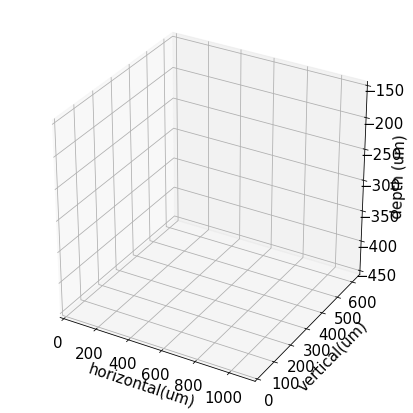

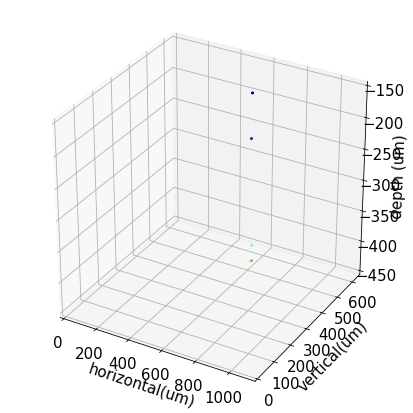

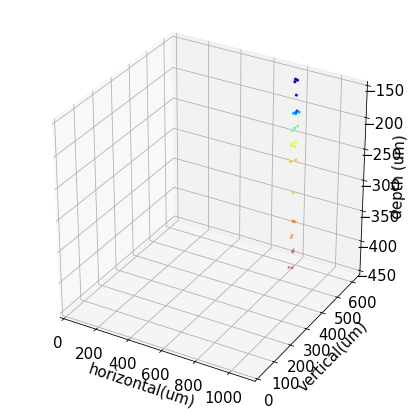

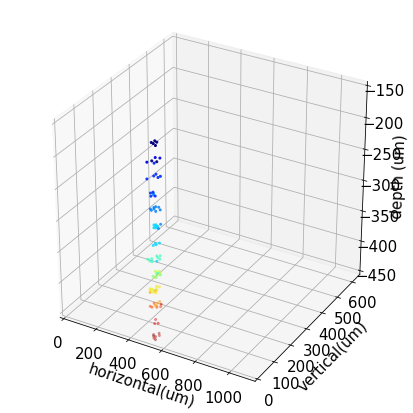

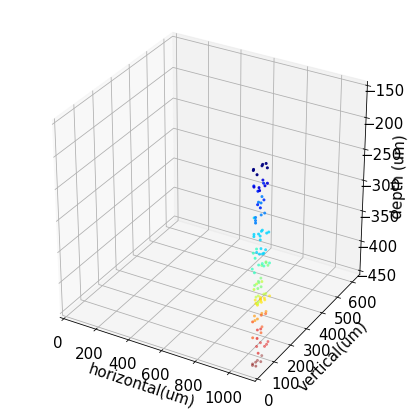

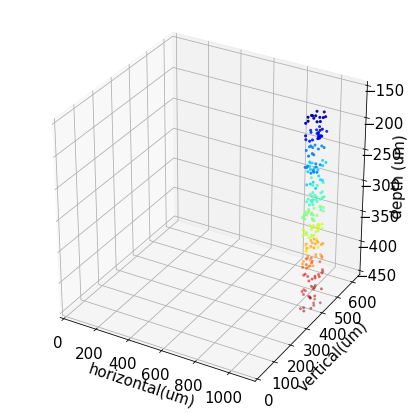

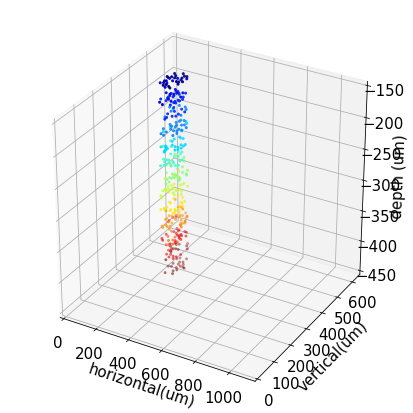

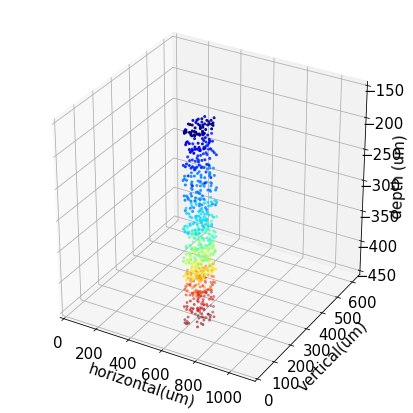

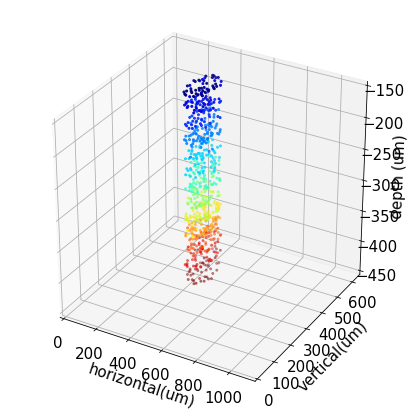

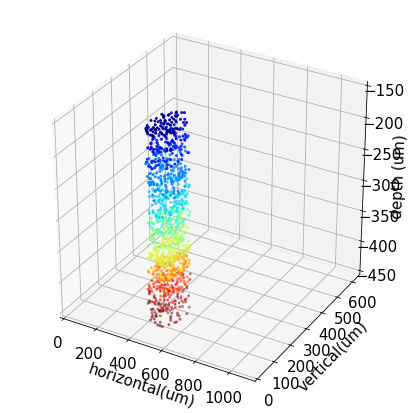

In [ ]:
for i in range(10):
  center_neuron_positions=np.random.randint(low=0, high=len(dat['xyz'][0]), size=(100,))
  cylinder_neuron_index_list= find_all_cylinder(dat['xyz'],center_neuron_positions,10*i)
  dense_cylinder_index=find_dense_cylinder_index(cylinder_neuron_index_list)

  x, y, z = dat['xyz'][:,cylinder_neuron_index_list[max]]
  zunq, iunq = np.unique(z, return_inverse=True)
  xc = np.linspace(0.0, 1.0, len(zunq))
  cmap = cm.get_cmap('jet')(xc)
  fig = plt.figure(figsize=(6,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlim(0,np.max(dat['xyz'][0,:]))
  ax.set_ylim(0,np.max(dat['xyz'][1,:]))
  ax.set_zlim(-450,np.max(dat['xyz'][2,:]))
  ax.scatter(x[::-1],y[::-1],z[::-1], 'o', s = 4, c = cmap[iunq])
  ax.set(xlabel='horizontal(um)', ylabel = 'vertical(um)', zlabel='depth (um)');


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  """


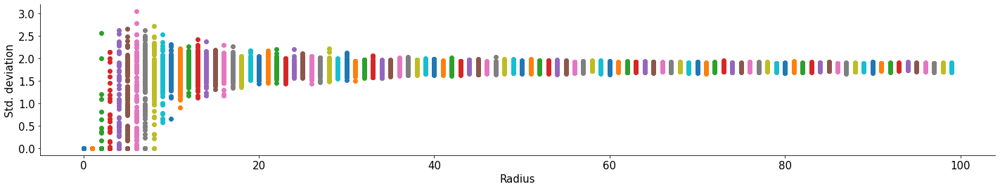

In [ ]:
#calculating orientation_selectivities of neurons
orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'],dat['istim'])
plt.xlabel("Radius")
plt.ylabel("Std. deviation")
#stddev_cylinder_orientation=[]
maximum_radius=100
number_of_column=100

for radius in range(0,maximum_radius):
  center_neuron_positions=np.random.randint(low=0, high=len(dat['xyz'][0]), size=(number_of_column,))
  cylinder_neuron_index_list= find_all_cylinder(dat['xyz'],center_neuron_positions,radius)
  stddev_cylinder_orientation=(find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list))
  
  x=np.ones(len(stddev_cylinder_orientation))*radius
  plt.scatter(x,stddev_cylinder_orientation)
  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  # This is added back by InteractiveShellApp.init_path()


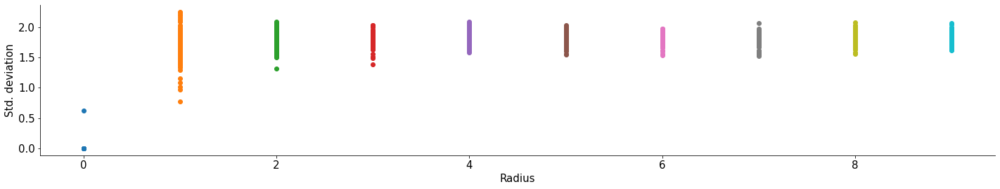

In [ ]:
#calculating orientation_selectivities of neurons
orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'],dat['istim'])
plt.xlabel("Radius")
plt.ylabel("Std. deviation")
#stddev_cylinder_orientation=[]
maximum_radius=10
number_of_column=100

for radius in range(1,maximum_radius):
  center_neuron_positions=np.random.randint(low=0, high=len(dat['xyz'][0]), size=(number_of_column,))
  cylinder_neuron_index_list= find_all_cylinder(dat['xyz'],center_neuron_positions,radius*10)
  stddev_cylinder_orientation=(find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list))
  
  x=np.ones(len(stddev_cylinder_orientation))*radius
  plt.scatter(x,stddev_cylinder_orientation)  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  # This is added back by InteractiveShellApp.init_path()


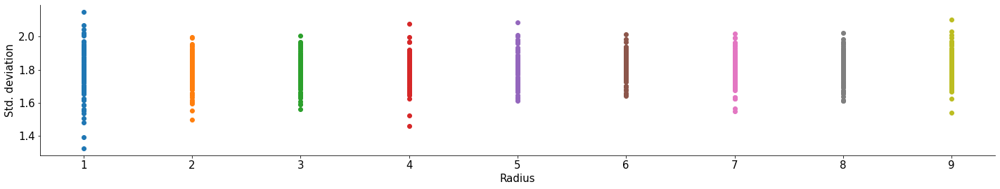

In [ ]:
#calculating orientation_selectivities of neurons
orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'],dat['istim'])
plt.xlabel("Radius")
plt.ylabel("Std. deviation")
#stddev_cylinder_orientation=[]
maximum_radius=10
number_of_column=100

for radius in range(1,maximum_radius):
  center_neuron_positions=np.random.randint(low=0, high=len(dat['xyz'][0]), size=(number_of_column,))
  cylinder_neuron_index_list= find_all_cylinder(dat['xyz'],center_neuron_positions,radius*20)
  stddev_cylinder_orientation=(find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list))
  
  x=np.ones(len(stddev_cylinder_orientation))*radius
  plt.scatter(x,stddev_cylinder_orientation)  

In [ ]:
stddev_cylinder_orientation

array([1.91832603, 0.47102332, 0.        , 0.75393672])

10


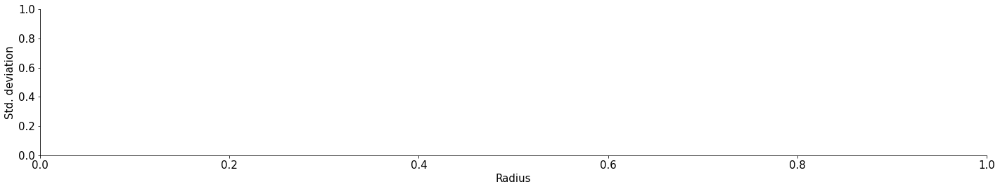

In [ ]:
plt.xlabel("Radius")
plt.ylabel("Std. deviation")
print(maximum_radius)
for i in range(3,maximun_radius):
  x=np.ones(len(stddev_cylinder_orientation[i]))*i
  print(i,len(x),len(stddev_cylinder_orientation[i]),stddev_cylinder_orientation[i])
  plt.scatter(x,stddev_cylinder_orientation[i])
  

In [ ]:
#print(orientation_selectivities[cylinder_neuron_index_list[0]])
#np.std(orientation_selectivities[cylinder_neuron_index_list[0]])
dev=find_stddev_cylinder_orientation(orientation_selectivities,cylinder_neuron_index_list)
print(cylinder_neuron_index_list)
print(dev)

[array([ 1247,  4202,  9322,  9715, 13429, 17497, 20253, 21760, 23000])
 array([ 5588, 14683, 20015, 23117])
 array([1385, 2306, 4170, 6466, 6720, 7758, 9767])]
[1.84844178 1.50769787 1.68595339]


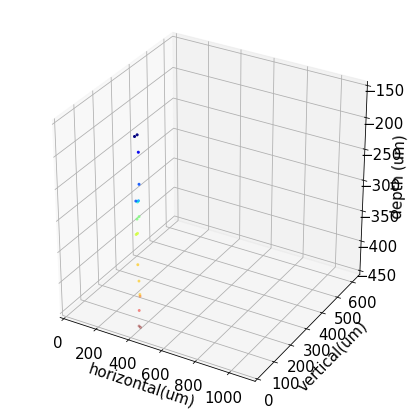

In [ ]:
x, y, z = dat['xyz'][:,cylinder_neuron_index_list[max]]

zunq, iunq = np.unique(z, return_inverse=True)
xc = np.linspace(0.0, 1.0, len(zunq))
cmap = cm.get_cmap('jet')(xc)
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.set_xlim(0,np.max(dat['xyz'][0,:]))
ax.set_ylim(0,np.max(dat['xyz'][1,:]))
ax.set_zlim(-450,np.max(dat['xyz'][2,:]))
ax.scatter(x[::-1],y[::-1],z[::-1], 'o', s = 4, c = cmap[iunq])
ax.set(xlabel='horizontal(um)', ylabel = 'vertical(um)', zlabel='depth (um)');

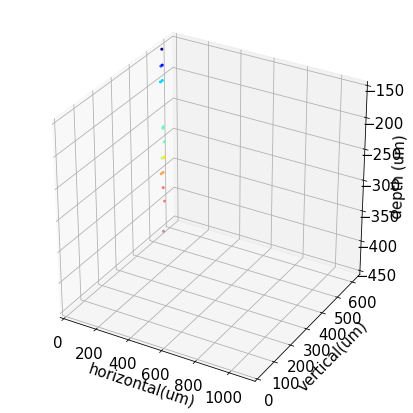

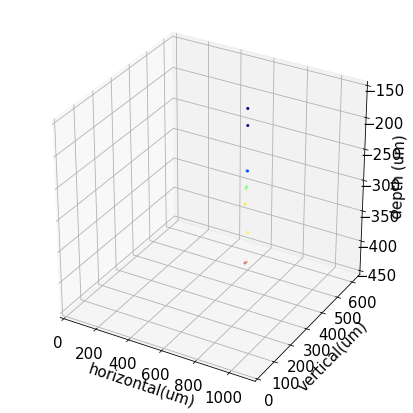

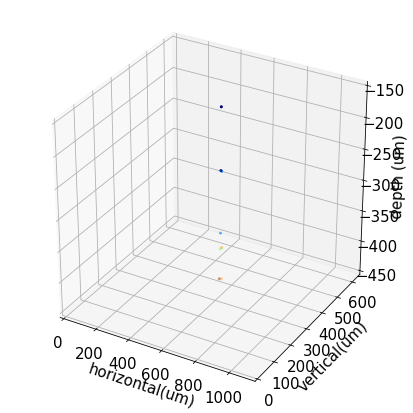

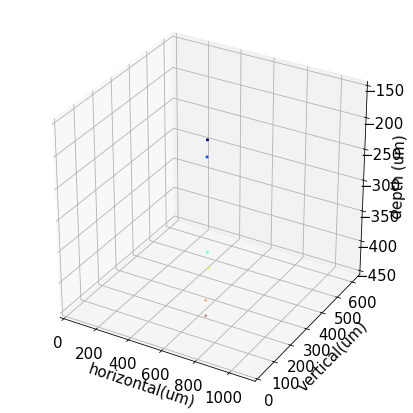

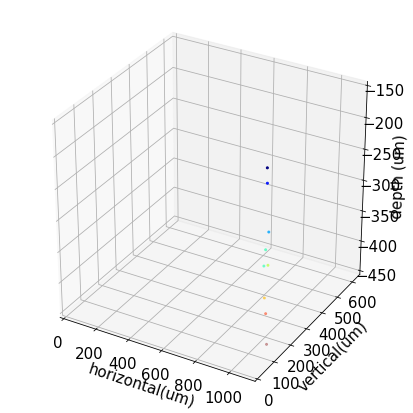

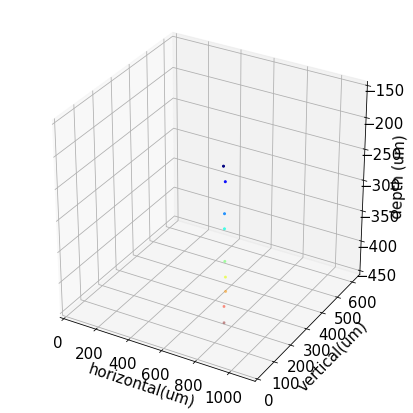

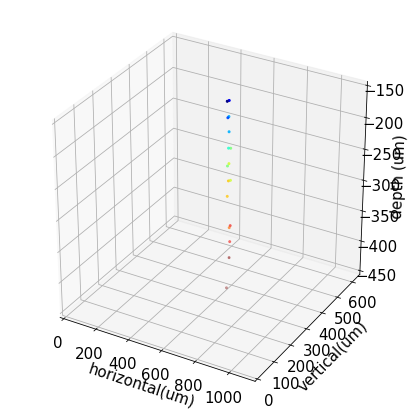

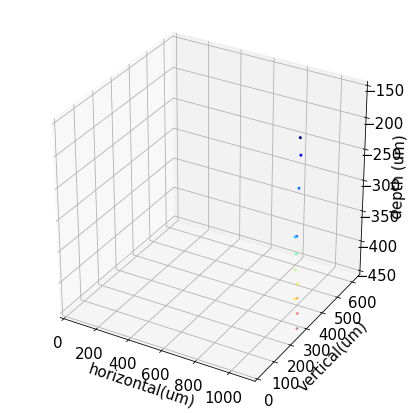

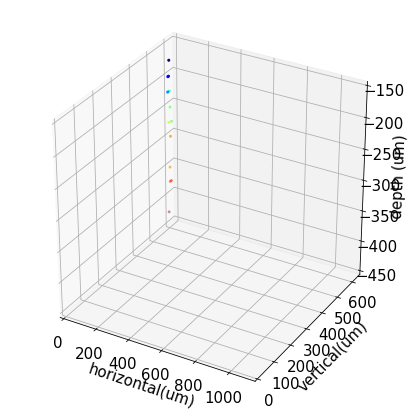

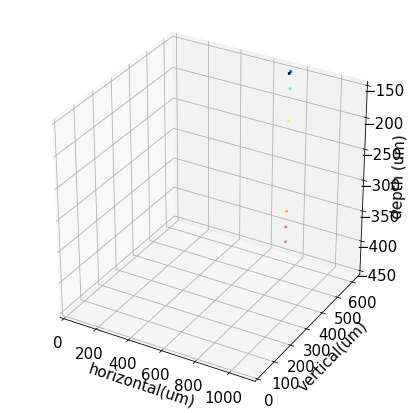

In [ ]:
for i in range(10):
  x, y, z = dat['xyz'][:,cylinder_neuron_index_list[i]]

  zunq, iunq = np.unique(z, return_inverse=True)
  xc = np.linspace(0.0, 1.0, len(zunq))
  cmap = cm.get_cmap('jet')(xc)

  fig = plt.figure(figsize=(6,6))
  ax = fig.add_subplot(111, projection='3d')
  ax.set_xlim(0,np.max(dat['xyz'][0,:]))
  ax.set_ylim(0,np.max(dat['xyz'][1,:]))
  ax.set_zlim(-450,np.max(dat['xyz'][2,:]))
  ax.scatter(x[::-1],y[::-1],z[::-1], 'o', s = 4, c = cmap[iunq])
  ax.set(xlabel='horizontal(um)', ylabel = 'vertical(um)', zlabel='depth (um)');

In [ ]:
def find_all_cylinder(neuron_positions,radius):
  cylinder=[]

  for i in range(len(neuron_positions[0])):
    for j in range(i)
    dist = np.sqrt((neuron_positions[0,j]-neuron_positions[0,center_neuron_position])**2+ (neuron_positions[1,i]-neuron_positions[1,center_neuron_position])**2)
    if(dist<=radius): 
        cylinder_neuron_index.append(i)
     
  return cylinder

In [ ]:
#calculating orientation_selectivities of neurons
orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'],dat['istim'])
cylinder_neuron_positions=find_cylinder_neuron(dat['xyz'],23500,radius=10)
print(cylinder_neuron_positions)
print(cylinder_neuron_orientations)
print(orientation_selectivities[cylinder_neuron_positions])
print(len(cylinder_neuron_orientations))
print(len(cylinder_neuron_positions))

[1361, 2223, 9023, 9298, 12748, 12759, 15540, 15808, 17108, 17638, 18236, 19861, 21285, 22929]
[2.047744883865765, 1.5650791839252478, 1.3085719487194087, 5.600149581685241, 5.754635735934861, 1.2971891094216745, 4.843279232042171, 6.035027590695118, 4.941470370895692, 1.97937357677086, 2.842543360310431, 0.09940780059480257, 3.5970514397473288, 1.2453224855589469]
[2.04774488 1.56507918 1.30857195 5.60014958 5.75463574 1.29718911
 4.84327923 6.03502759 4.94147037 1.97937358 2.84254336 0.0994078
 3.59705144 1.24532249]
14
14


In [ ]:
dat['xyz'][:,cylinder_neuron_positions]

array([], shape=(3, 0), dtype=float64)

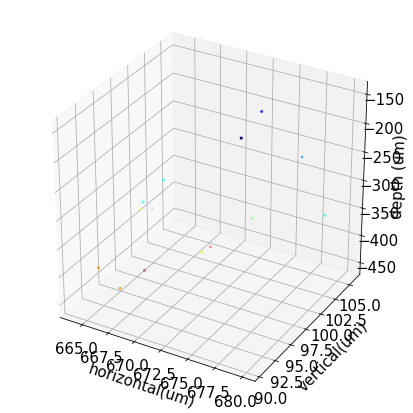

In [ ]:
x, y, z = dat['xyz'][:,cylinder_neuron_positions]

zunq, iunq = np.unique(z, return_inverse=True)
xc = np.linspace(0.0, 1.0, len(zunq))
cmap = cm.get_cmap('jet')(xc)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x[::-1],y[::-1],z[::-1], 'o', s = 4, c = cmap[iunq])
ax.set(xlabel='horizontal(um)', ylabel = 'vertical(um)', zlabel='depth (um)');

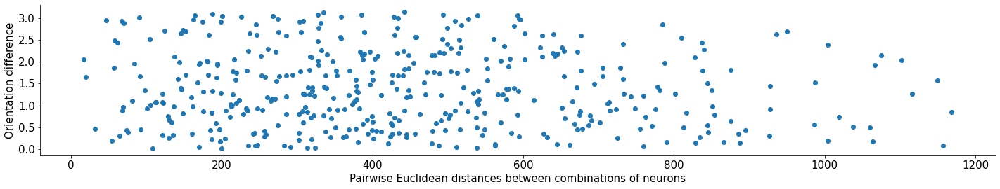

In [ ]:
#calculating orientation_selectivities of neurons
orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'],dat['istim'])

# calling quantify_pinwheel function
euclidean_distances,orientation_similarity=quantify_pinwheel(dat['xyz'][:,:30],orientation_selectivities) #for first 30 set of neurons

plt.scatter(euclidean_distances,orientation_similarity)
plt.xlabel("Pairwise Euclidean distances between combinations of neurons")
plt.ylabel("Orientation difference")
plt.show()

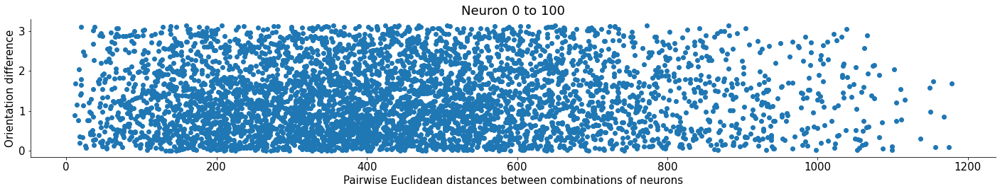

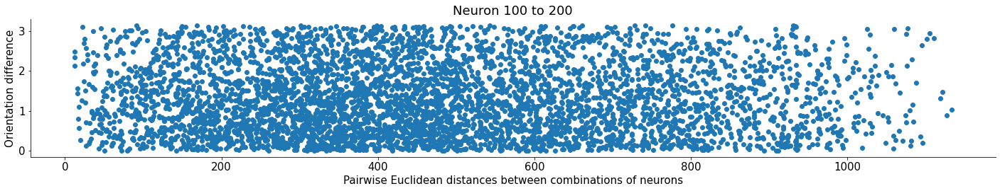

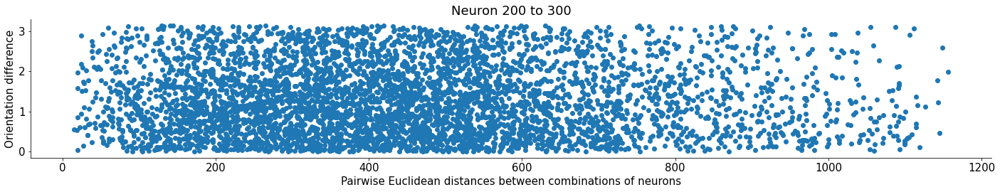

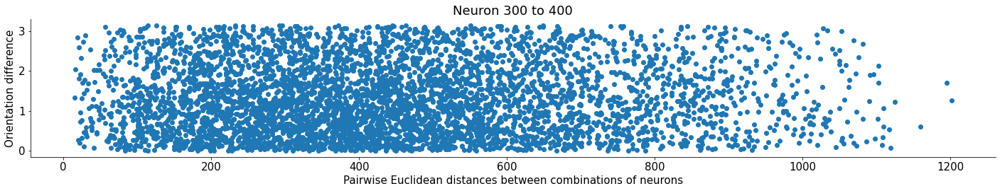

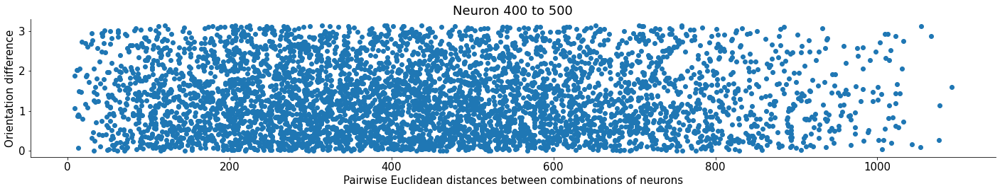

...

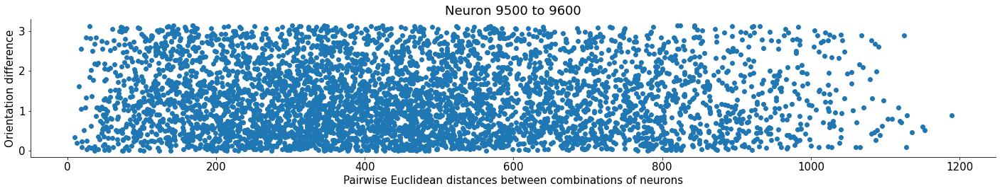

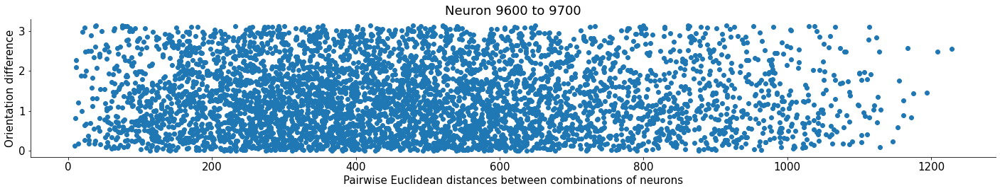

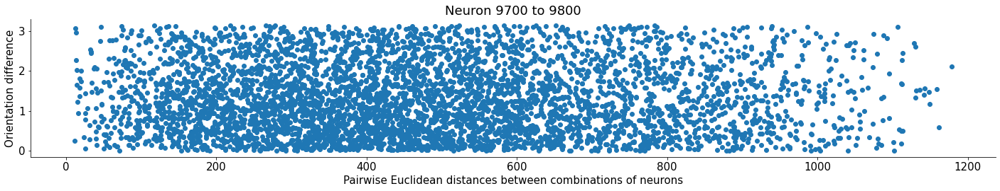

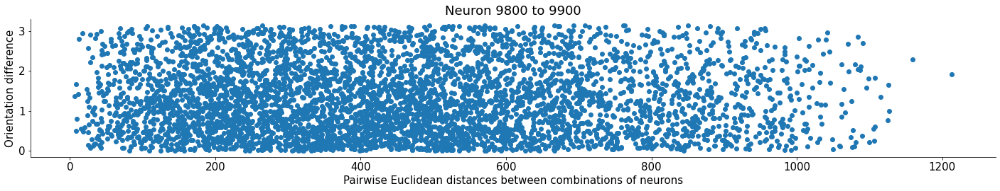

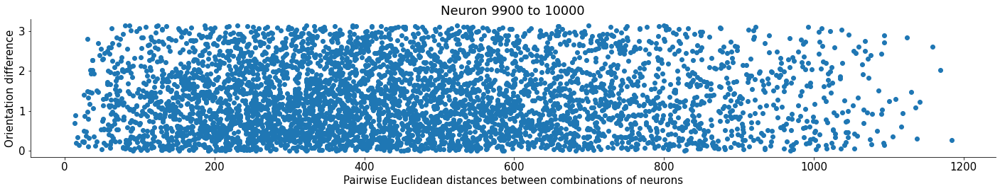

In [ ]:
for i in range(100):
  # calling quantify_pinwheel function
  
  euclidean_distances,orientation_similarity=quantify_pinwheel(dat['xyz'][:,i*100:i*100+100],orientation_selectivities) #for first 30 set of neurons
  
  plt.scatter(euclidean_distances,orientation_similarity)
  plt.title('Neuron {}'.format(i*100)+' to {}'.format(i*100+100))
  plt.xlabel("Pairwise Euclidean distances between combinations of neurons")
  plt.ylabel("Orientation difference")
  plt.show()

In [ ]:
x,y,z =dat['xyz']
layer_index=np.empty(14,int)
print(np.unique(z))
for i in range(13):
  print(i,-150-i*25,np.count_nonzero(z==-150-i*25),np.where(z==-150-i*25),np.where(z==-150-i*25)[0][0])
  layer_index[i]=np.where(z==-150-i*25)[0][0]
layer_index[i+1]=layer_index[i]+1293  
print(layer_index)

[-450. -425. -400. -375. -350. -325. -300. -275. -250. -225. -200. -175.
 -150.]
0 -150 1815 (array([   0,    1,    2, ..., 1812, 1813, 1814]),) 0
1 -175 1760 (array([1815, 1816, 1817, ..., 3572, 3573, 3574]),) 1815
2 -200 1659 (array([3575, 3576, 3577, ..., 5231, 5232, 5233]),) 3575
3 -225 1682 (array([5234, 5235, 5236, ..., 6913, 6914, 6915]),) 5234
4 -250 1764 (array([6916, 6917, 6918, ..., 8677, 8678, 8679]),) 6916
5 -275 1811 (array([ 8680,  8681,  8682, ..., 10488, 10489, 10490]),) 8680
6 -300 1901 (array([10491, 10492, 10493, ..., 12389, 12390, 12391]),) 10491
7 -325 2011 (array([12392, 12393, 12394, ..., 14400, 14401, 14402]),) 12392
8 -350 2167 (array([14403, 14404, 14405, ..., 16567, 16568, 16569]),) 14403
9 -375 2280 (array([16570, 16571, 16572, ..., 18847, 18848, 18849]),) 16570
10 -400 1871 (array([18850, 18851, 18852, ..., 20718, 20719, 20720]),) 18850
11 -425 1573 (array([20721, 20722, 20723, ..., 22291, 22292, 22293]),) 20721
12 -450 1295 (array([22294, 22295, 22296, ..

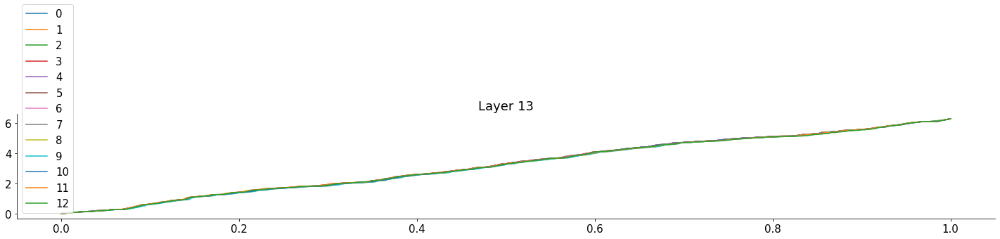

In [ ]:
for i in range(13):
  orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'][layer_index[i]:layer_index[i+1]-1],dat['istim'][layer_index[i]:layer_index[i+1]-1])
  x=np.linspace(0,1,orientation_selectivities.shape[0])
  plt.plot(x,np.sort(orientation_selectivities),label=i)
  plt.title('Layer {}'.format(i+1))
  #print(i,np.average(orientation_selectivities))
# # show a legend on the plot
plt.legend()
  
# function to show the plot
plt.show()


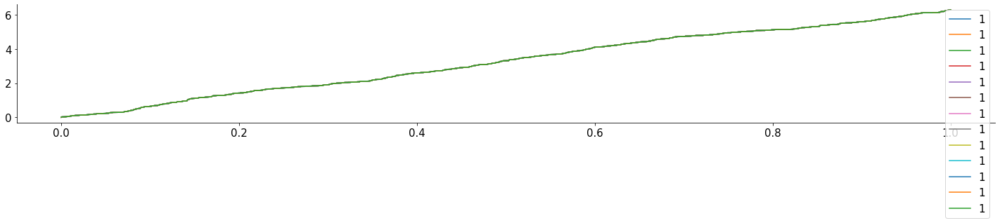

In [ ]:
for i in range(13):
  i=1
  orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'][layer_index[i]:layer_index[i+1]-1],dat['istim'][layer_index[i]:layer_index[i+1]-1])
  x=np.linspace(0,1,orientation_selectivities.shape[0])
  plt.plot(x,np.sort(orientation_selectivities),label=i)
  #print(i,np.average(orientation_selectivities))
# # show a legend on the plot
plt.legend()
  
# function to show the plot
plt.show()


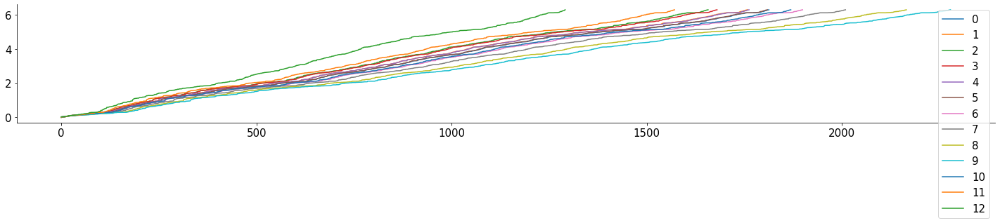

In [ ]:
for i in range(13):
  orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'][layer_index[i]:layer_index[i+1]-1],dat['istim'][layer_index[i]:layer_index[i+1]-1])
  #x=np.linspace(0,1,orientation_selectivities.shape[0])
  plt.plot(np.sort(orientation_selectivities),label=i)
  #print(i,np.average(orientation_selectivities))
# # show a legend on the plot
plt.legend()
  
# function to show the plot
plt.show()


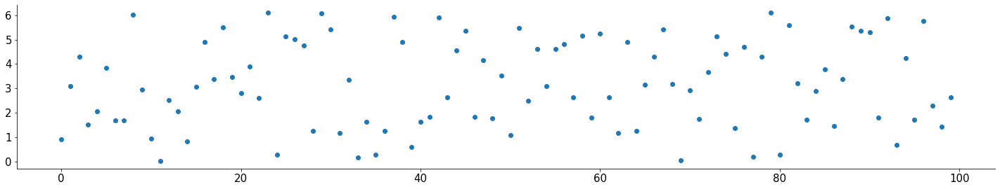

0 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
1 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
2 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]


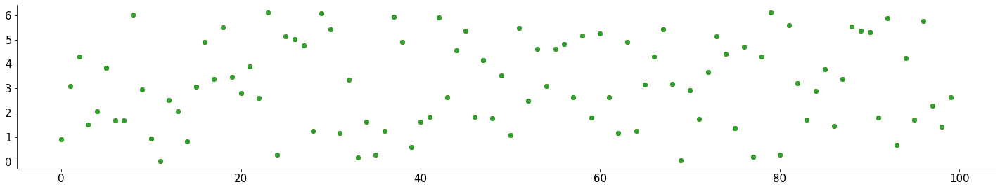

3 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
4 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
5 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]


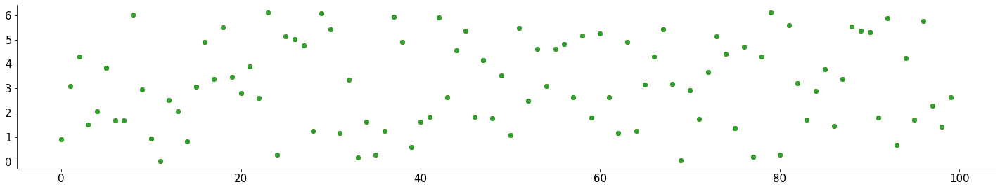

6 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
7 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
8 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]


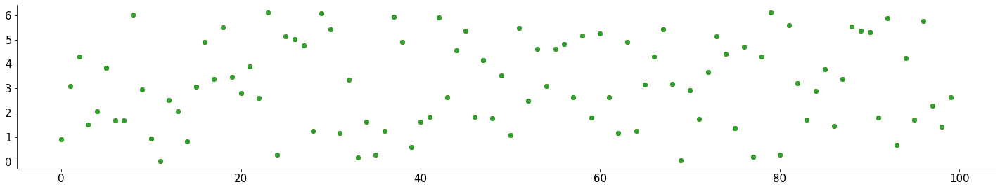

9 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
10 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]
11 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]


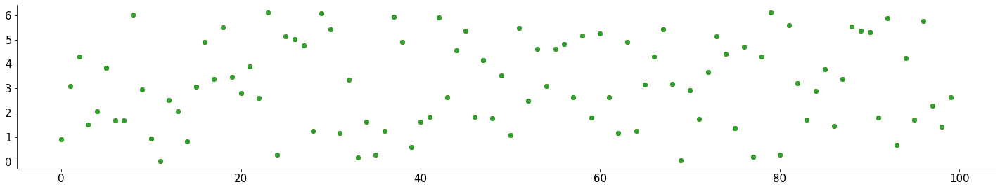

No handles with labels found to put in legend.


12 [0.92209446 3.108745   4.30245327 1.53591208 2.05433404 3.8424449
 1.70961083 1.69438826 6.02830363 2.96800987]


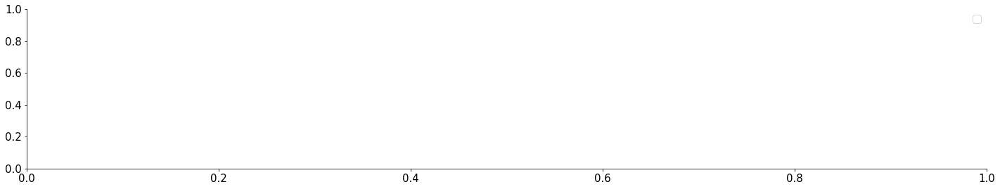

In [ ]:
for i in range(13):
  orientation_selectivities=calculate_all_orientation_selectivities(dat['sresp'][layer_index[i]:layer_index[i+1]-1],dat['istim'][layer_index[i]:layer_index[i+1]-1])
  x=range(0,100)
  plt.scatter(x,(orientation_selectivities)[0:100],label=i)
  if(i%3==0):plt.show()
  print(i,orientation_selectivities[0:10])
# # show a legend on the plot
plt.legend()
  
# function to show the plot
plt.show()


In [ ]:
df = pd.DataFrame(dat['xyz']).T
df.to_excel(excel_writer = "test.xlsx")

In [ ]:
x,y,z =dat['xyz']
#print(dat['xyz'][:,0:100])
zcord=np.unique(z)
xyz=[]

for i in range(5):
  for j in range(5):
    coordinate=np.empty(3,float)
    for k in range(zcord) :
      coordinate=(x[i],y[j],z[k])
    xyz.append(coordinate)
print(xyz)    

[(448.0, 26.6, -150.0), (448.0, 119.7, -150.0), (448.0, 200.83, -150.0), (448.0, 591.85, -150.0), (448.0, 208.81, -150.0), (1080.0, 26.6, -150.0), (1080.0, 119.7, -150.0), (1080.0, 200.83, -150.0), (1080.0, 591.85, -150.0), (1080.0, 208.81, -150.0), (342.0, 26.6, -150.0), (342.0, 119.7, -150.0), (342.0, 200.83, -150.0), (342.0, 591.85, -150.0), (342.0, 208.81, -150.0), (32.0, 26.6, -150.0), (32.0, 119.7, -150.0), (32.0, 200.83, -150.0), (32.0, 591.85, -150.0), (32.0, 208.81, -150.0), (996.0, 26.6, -150.0), (996.0, 119.7, -150.0), (996.0, 200.83, -150.0), (996.0, 591.85, -150.0), (996.0, 208.81, -150.0)]


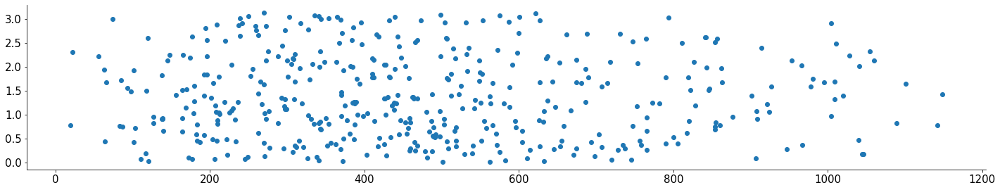

In [ ]:
plt.scatter(euclidean_distances,orientation_similarity)

<BarContainer object of 435 artists>

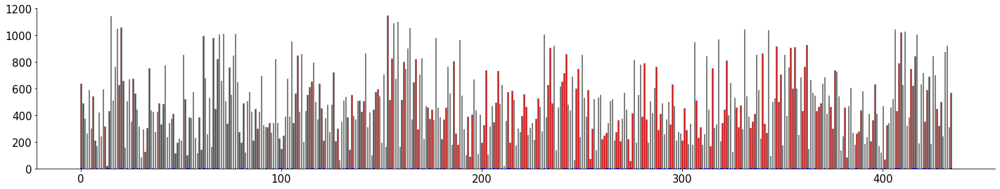

In [ ]:
# Make the plot
x=np.array(range(0,len(euclidean_distances)))
plt.bar(x,euclidean_distances, color ='r', width = 0.5,
        edgecolor ='grey', label ='euclidean_distances')
plt.bar(x, orientation_similarity, color ='y', width = 0.5,
        edgecolor ='blue', label ='orientation_similarity')